In [1]:
%load_ext autoreload
%autoreload 2

%config InlineBackend.figure_format = 'retina'

In [2]:
import scanpy as sc 
import sys 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sys.path.append('../../src')
import warnings
warnings.filterwarnings('ignore')

from spaceoracle.prophets import Prophet

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [11]:
# adata_train = sc.read_h5ad(
#     '/ix/djishnu/shared/djishnu_kor11/training_data/slideseq_spleen.h5ad')

adata_train = sc.read_h5ad(
    '/Users/koush/Projects/SpaceOracle/data/slidetags/snrna_human_tonsil.h5ad')

# adata_train = adata_train[adata_train.obs.cell_type.isin(['B_germinal_center', 'T_follicular_helper'])]

pythia = Prophet(
    adata=adata_train,
    models_dir='/Users/koush/Downloads/models_snrna_human_tonsil_v2',
    annot='clusters',
    annot_labels='cell_type'
)

In [12]:
pythia.queue

OracleQueue with 0 remaining genes

In [13]:
pythia.compute_betas()

100%|██████████| 3418/3418 [00:31<00:00, 107.83it/s]


In [14]:
goi = 'BCL6'

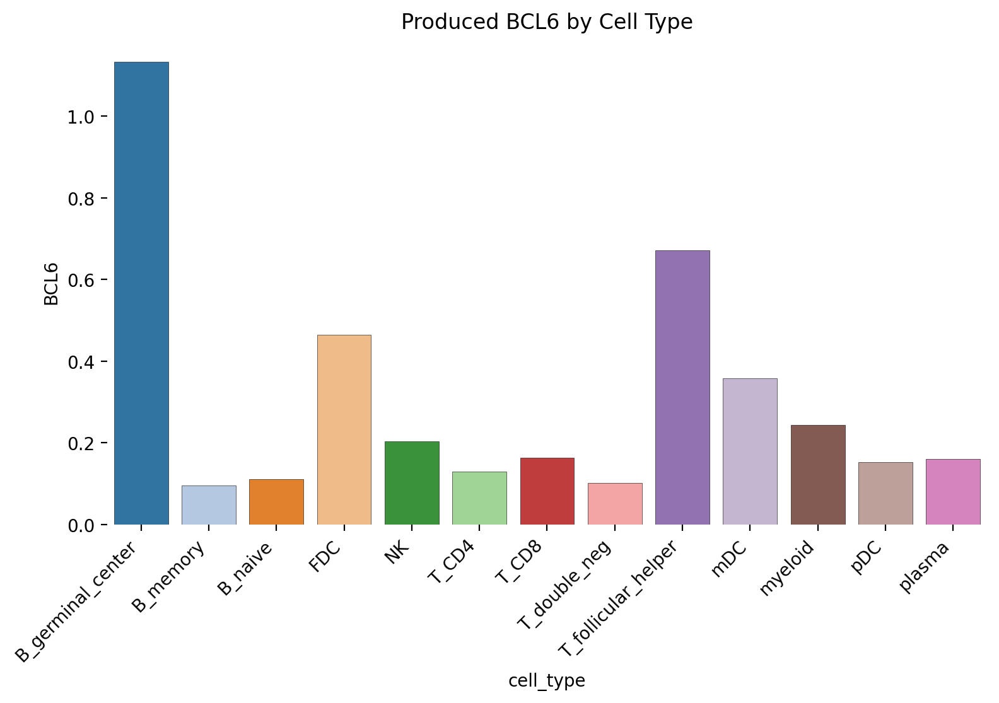

In [15]:
plt.rcParams['figure.figsize'] = (9, 5)
plt.rcParams['figure.dpi'] = 100


xy = pd.DataFrame(pythia.adata.obsm['spatial'], columns=['x', 'y'], index=pythia.adata.obs_names)
sns.barplot(
    data=pythia.adata.to_df(layer='imputed_count').join(xy).join(
        pythia.adata.obs['cell_type']).groupby(
            'cell_type')[goi].mean().reset_index(),
    x='cell_type',
    y=goi,
    linewidth=0.2,
    edgecolor='black',
    palette='tab20'
)
plt.xticks(rotation=45, ha='right')
plt.title(f'Produced {goi} by Cell Type')
plt.box(False)
plt.show()

In [18]:
# cells = list(
#     pythia.adata.obs.reset_index()[
#         pythia.adata.obs.reset_index()['cell_type'].isin(
#             ['T_follicular_helper']
#         )].index)

cell_idx = xy[
    (xy.x > 2000) & (xy.y < 1500)].join(
    pythia.adata.obs['cell_type']).query('cell_type=="B_germinal_center"').index

cells = pythia.adata.obs.reset_index()[pythia.adata.obs.reset_index()['NAME'].isin(cell_idx)].index.tolist()

# cells = pythia.adata.obs.reset_index().index.tolist()
len(cells), len(adata_train.obs)

(266, 5778)

In [19]:
import numpy as np

<Axes: xlabel='x', ylabel='y'>

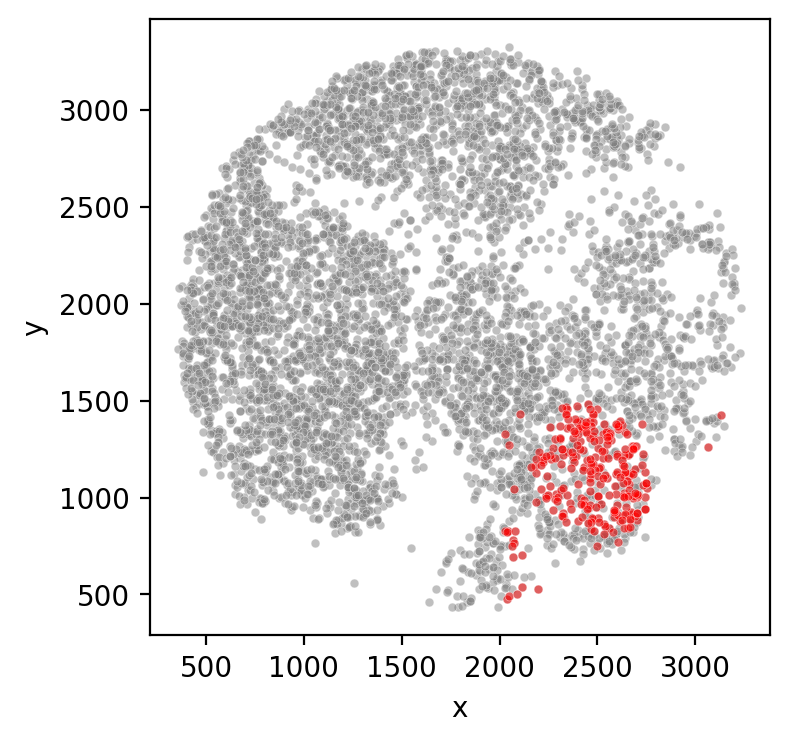

In [20]:
plt.rcParams['figure.figsize'] = (4, 4)
sns.scatterplot(
    x='x', y='y', 
    data=xy.join(pythia.adata.obs['cell_type']), 
    s=10,
    color='grey',
    alpha=0.5,
    legend=False
)

sns.scatterplot(
    x='x', y='y', 
    data=xy.join(pythia.adata.obs['cell_type']).iloc[cells], 
    color='red',
    s=10,
    alpha=0.5, 
    legend=False
)


In [21]:
pythia.perturb(
    target=goi, 
    n_propagation=3, 
    gene_expr=0, 
    cells=cells,
    retain_propagations=True
)

Interactions: 100%|██████████| 3418/3418 [01:38<00:00, 34.63it/s]


<Axes: xlabel='x', ylabel='y'>

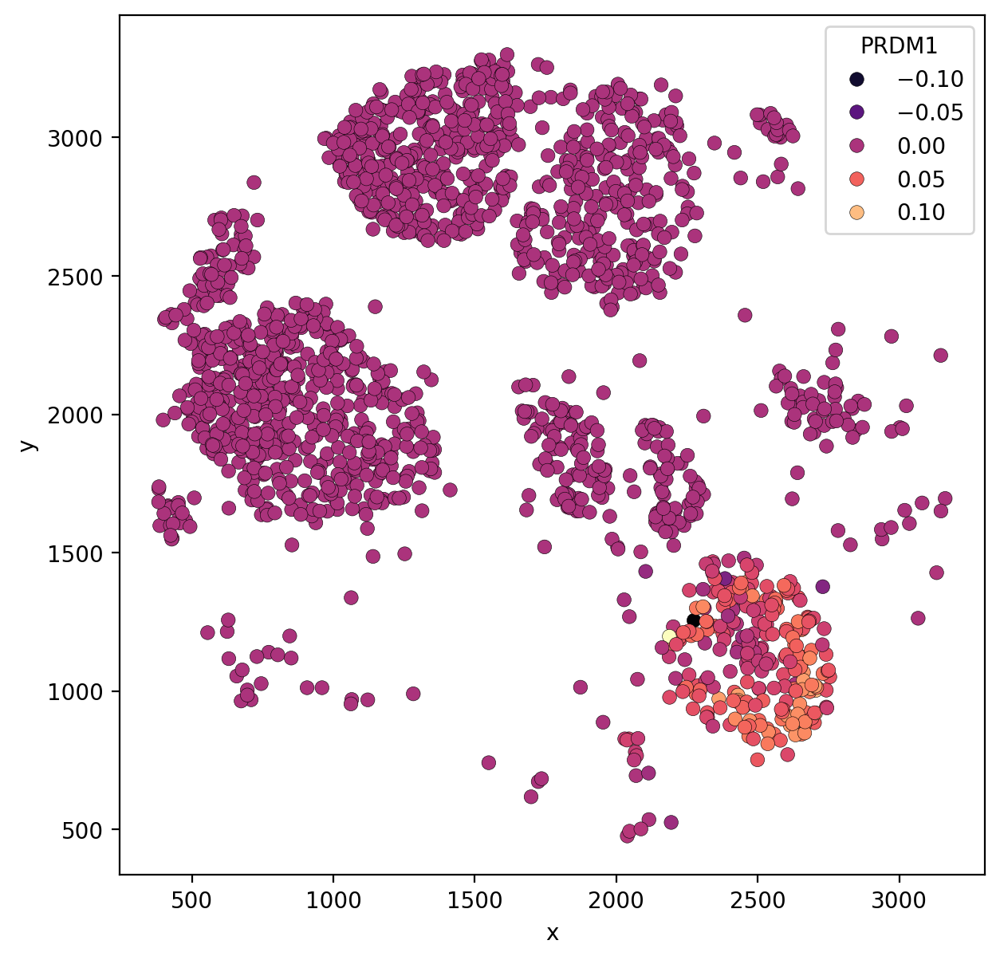

In [23]:
plt.rcParams['figure.figsize'] = (7, 7)
plt.rcParams['figure.dpi'] = 100
sns.scatterplot(
    x='x', y='y', 
    data=pythia.adata.to_df(layer='delta_X').join(xy).join(
        pythia.adata.obs['cell_type']).query('cell_type=="B_germinal_center"'), 
    hue='PRDM1', 
    palette='magma',
    linewidth=0.2,
    edgecolor='black',
    s=40,
)

In [24]:
import numpy as np
from sklearn.neighbors import NearestNeighbors
from velocyto.estimation import colDeltaCor, colDeltaCorpartial

def estimate_transition_probabilities(adata, delta_X, embedding=None, n_neighbors=200, 
random_neighbors=False, annot=None, T=0.05, n_jobs=1):

    n_cells, n_genes = adata.shape
    delta_X = np.array(delta_X)
    gene_mtx = adata.layers['imputed_count']
    
    if n_neighbors is None:

        P = np.ones((n_cells, n_cells))

        corr = colDeltaCor(
            np.ascontiguousarray(gene_mtx.T), 
            np.ascontiguousarray(delta_X.T), 
            threads=n_jobs
            )
    
    else:

        P = np.zeros((n_cells, n_cells))

        n_neighbors = min(n_cells, n_neighbors)
        
        if random_neighbors == 'even':

            cts = np.unique(adata.obs[annot])
            ct_dict = {ct: np.where(adata.obs[annot] == ct)[0] for ct in cts}
            cells_per_ct = round(n_neighbors / len(cts))

            indices = []

            for i in range(n_cells):
                i_indices = []

                for ct, ct_cells in ct_dict.items():

                    sample = np.random.choice(ct_cells[ct_cells != i], size=cells_per_ct, replace=False)
                    i_indices.extend(sample)

                i_indices = np.array(i_indices)
                P[i, i_indices] = 1
                indices.append(i_indices)

            indices = np.array(indices)

        elif random_neighbors:
            
            indices = []
            cells = np.arange(n_cells)
            for i in range(n_cells):
                i_indices = np.random.choice(np.delete(cells, i), size=n_neighbors, replace=False)
                P[i, i_indices] = 1
                indices.append(i_indices)
            
            indices = np.array(indices)

        else: 

            nn = NearestNeighbors(n_neighbors=n_neighbors, n_jobs=n_jobs)
            nn.fit(embedding)
            _, indices = nn.kneighbors(embedding)

            rows = np.repeat(np.arange(n_cells), n_neighbors)
            cols = indices.flatten()
            P[rows, cols] = 1

        corr = colDeltaCorpartial(
            np.ascontiguousarray(gene_mtx.T), 
            np.ascontiguousarray(delta_X.T), 
            indices, threads=n_jobs
            )

    np.fill_diagonal(P, 0)
    corr = np.nan_to_num(corr, nan=1)
    P *= np.exp(corr / T)   
    P /= P.sum(1)[:, None]

    return corr, P

In [25]:
import cellrank as cr

In [26]:
delta_df = pythia.adata.to_df(layer='delta_X').copy()
# delta_df = pythia.adata.to_df(layer='imputed_count') - pythia.propagations[0]

<Axes: xlabel='cell_type'>

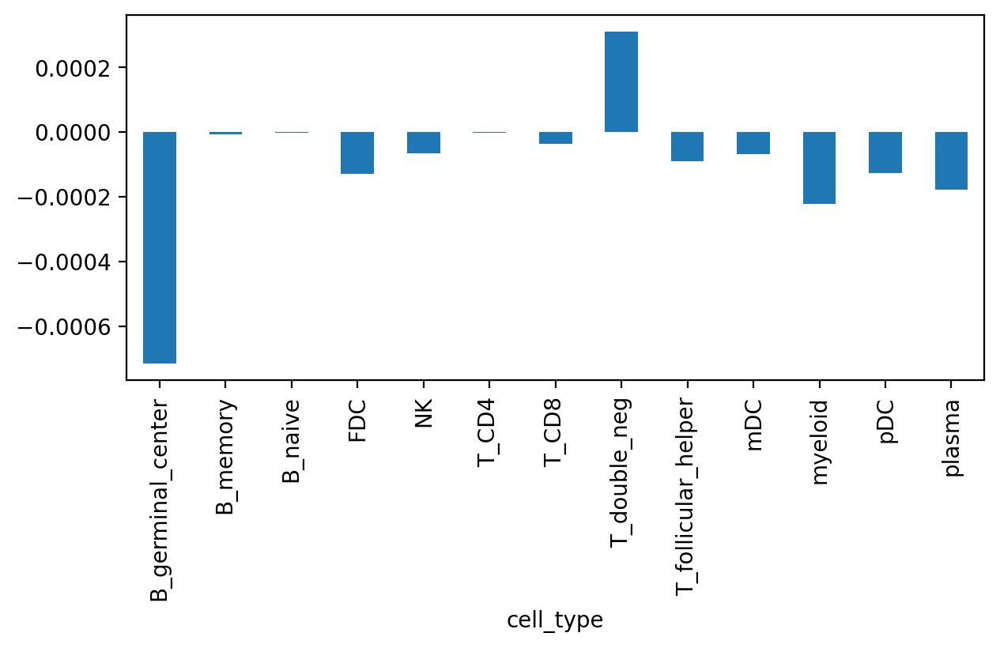

In [27]:
plt.rcParams['figure.figsize'] = (7, 3)
delta_df.join(pythia.adata.obs['cell_type']).groupby('cell_type').mean().mean(1).plot.bar()

In [28]:
import matplotlib.pyplot as plt

In [29]:
sc.pp.neighbors(pythia.adata)
sc.tl.umap(pythia.adata)

/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 3544 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


In [30]:
# delta_df = pythia.adata.to_df(layer='imputed_count').copy()
# delta_df[goi] = 0
# delta_df = delta_df - pythia.adata.to_df(layer='imputed_count').copy()

In [31]:
adata_shuff = pythia.adata.copy()
adata_shuff.layers['imputed_count'] = adata_shuff.to_df(layer='imputed_count').sample(frac=1).values

In [32]:
corr_rand, P_rand  = estimate_transition_probabilities(
    adata_shuff, 
    delta_df.values,
    n_neighbors=None,
    random_neighbors=True,
    embedding=None, 

)

adata_shuff.obsp['ko_shift'] = P_rand.copy()

corr, P = estimate_transition_probabilities(
    pythia.adata, 
    delta_df.values,
    random_neighbors=False,
    n_neighbors=300,
    embedding=pythia.adata.obsm['X_umap'], 
)

pythia.adata.obsp['ko_shift'] = P.copy()

In [33]:
ck = cr.kernels.ConnectivityKernel(pythia.adata, conn_key='ko_shift')
ck_rand = cr.kernels.ConnectivityKernel(adata_shuff, conn_key='ko_shift')
ck.compute_transition_matrix(density_normalize=True)
ck_rand.compute_transition_matrix(density_normalize=True)

ConnectivityKernel[n=5778, dnorm=True, key='ko_shift']

In [55]:
delta_df2 = delta_df.copy()

In [76]:
delta_df2['abs_delta'] = delta_df2.abs().mean(1)

In [77]:
delta_df2 = delta_df2.iloc[list(set(pythia.adata.obs.reset_index().index.tolist()) - set(cells))]

<Axes: xlabel='x', ylabel='y'>

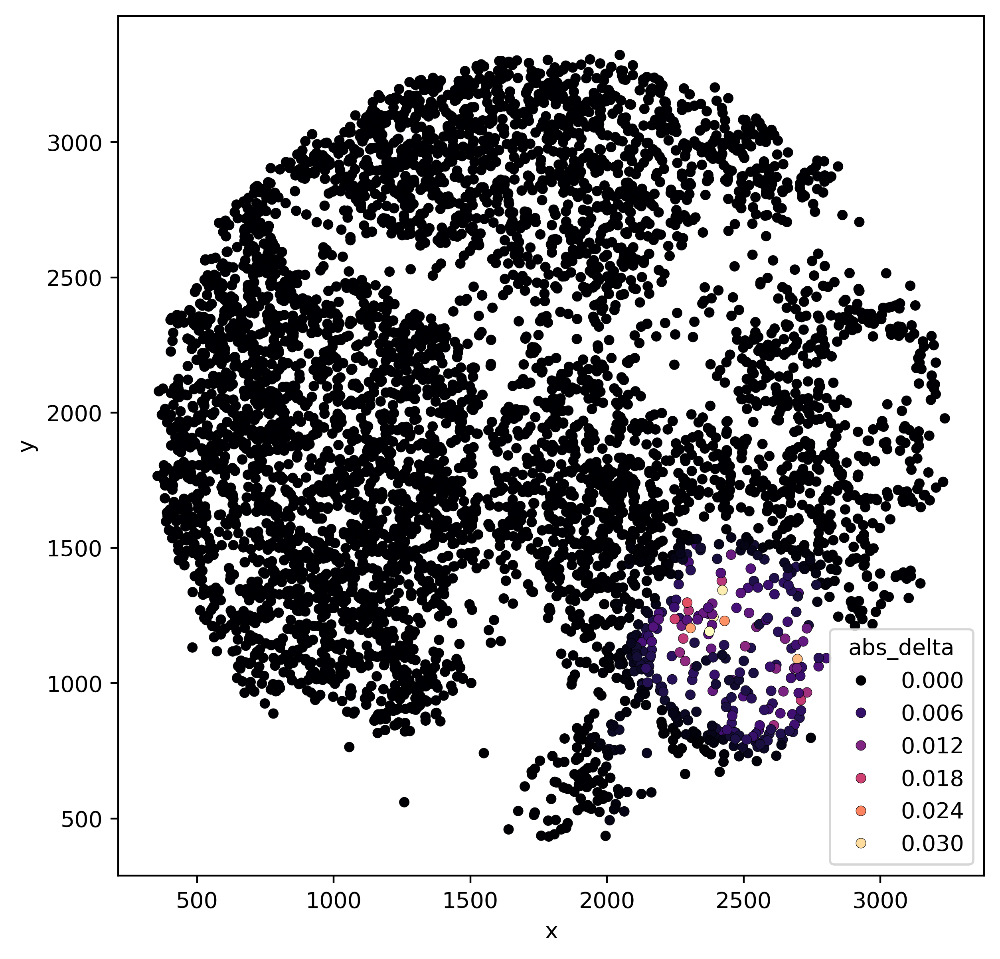

In [80]:
sns.scatterplot(
    x='x', y='y', 
    data=delta_df2.join(pythia.adata.obs['cell_type']).join(xy), 
    hue='abs_delta', 
    palette='magma',
    linewidth=0.2,
    edgecolor='black',
    s=20,
)


Renamed 'spatial' to convention 'X_spatial' (adata.obsm).
Renamed 'spatial' to convention 'X_spatial' (adata.obsm).


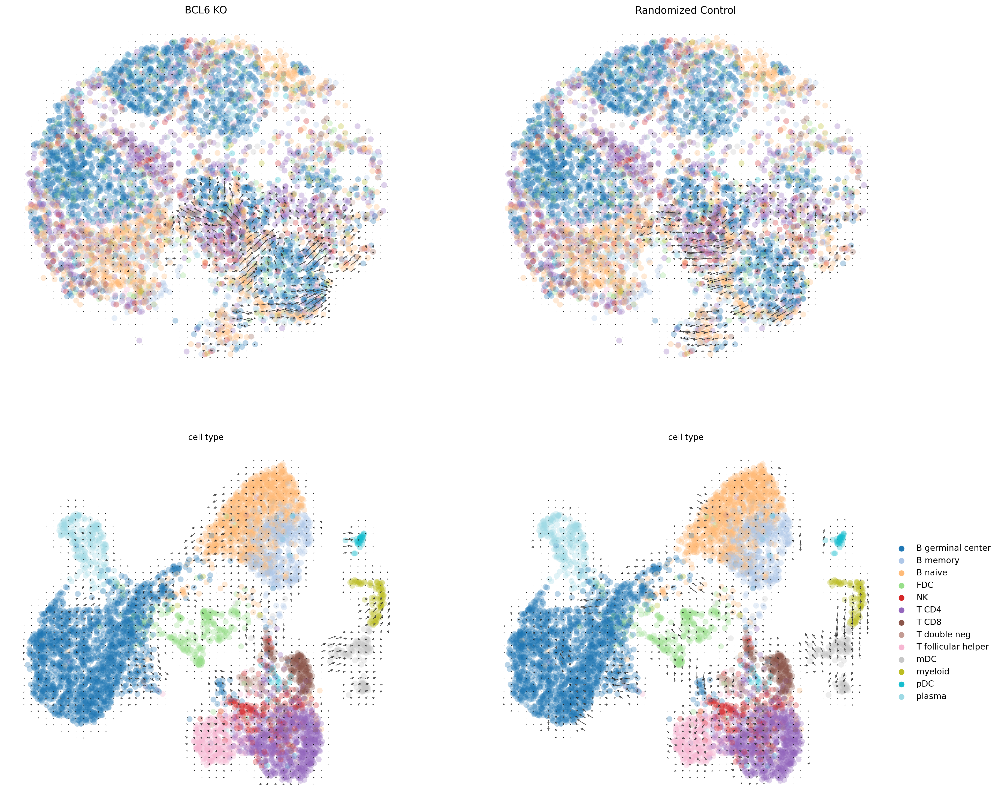

In [34]:
f, ax = plt.subplots(2, 2, figsize=(19, 8.5*2), dpi=120)
ax = ax.flatten()

projection_params_basis = {
    'basis': 'spatial',
    'color': 'cell_type', 
    'legend_loc': 'right',
    'recompute': True,
    'stream': False,
    'scale': 1.5,
    'alpha': 0.3,
    'size': 200,
    'show': False,
    'palette': 'tab20',
    'smooth': 0.9,
    'n_neighbors': 100
}

projection_params_umap = projection_params_basis.copy()
projection_params_umap.update({'basis': 'umap'})

scatter_params = {
    'x': 'x',
    'y': 'y',
    'data': xy.join(pythia.adata.obs['cell_type']).iloc[cells],
    'color': 'red', 
    's': 50,
    'legend': False,
    'linewidth': 0.4,
    'alpha': 0.5,
    'edgecolor': 'black',
    'marker': 'X'
}

# Plot KO projection
ck.plot_projection(**projection_params_basis, ax=ax[0])
ck.plot_projection(**projection_params_umap, ax=ax[2])


# Plot randomized control
ck_rand.plot_projection(**projection_params_basis, ax=ax[1]) 
ck_rand.plot_projection(**projection_params_umap, ax=ax[3]) 


# sns.scatterplot(**scatter_params, ax=ax[0])
# sns.scatterplot(**scatter_params, ax=ax[1])

# Add titles
ax[0].set_title(f'{goi} KO')
ax[1].set_title('Randomized Control')
ax[0].get_legend().remove()
ax[1].get_legend().remove()
ax[2].get_legend().remove()

plt.show()

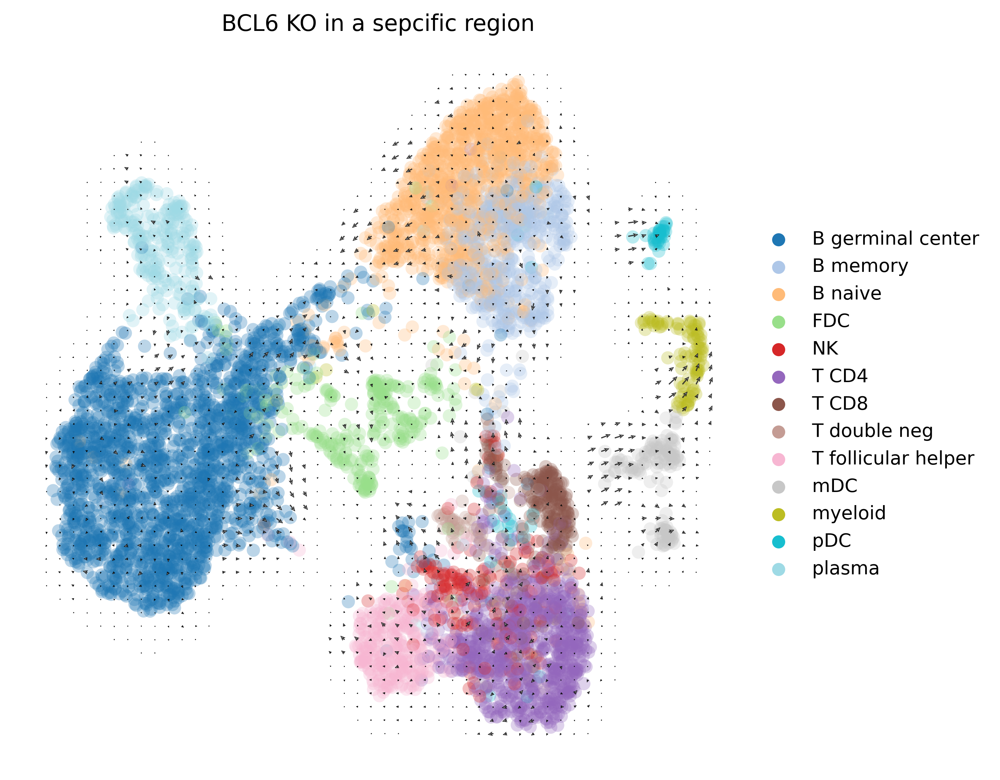

In [89]:
plt.rcParams['figure.figsize'] = (7, 7)
plt.rcParams['figure.dpi'] = 200
scatter_params['s'] = 10

projection_params_basis = {
    'basis': 'umap',
    'color': 'cell_type', 
    'legend_loc': 'right',
    'recompute': True,
    'stream': False,
    'scale': 1.5,
    'alpha': 0.3,
    'size': 200,
    'show': False,
    'palette': 'tab20',
    'smooth': 1,
    'n_neighbors': 10
}

ck.plot_projection(**projection_params_basis)
# sns.scatterplot(**scatter_params)
plt.title(f'{goi} KO in a sepcific region')
plt.show()

In [229]:
pd.DataFrame(
    P, index=pythia.adata.obs.cell_type, 
    columns=pythia.adata.obs.cell_type).iloc[0].to_frame().reset_index().query(
        'cell_type == "T_CD4"').sort_values(by='T_CD4', ascending=False)

,cell_type,T_CD4
489,T_CD4,0.108859
1714,T_CD4,0.103350
4106,T_CD4,0.101567
4307,T_CD4,0.060230
4284,T_CD4,0.058505
...,...,...
2184,T_CD4,0.000000
2187,T_CD4,0.000000
2191,T_CD4,0.000000
2192,T_CD4,0.000000


/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


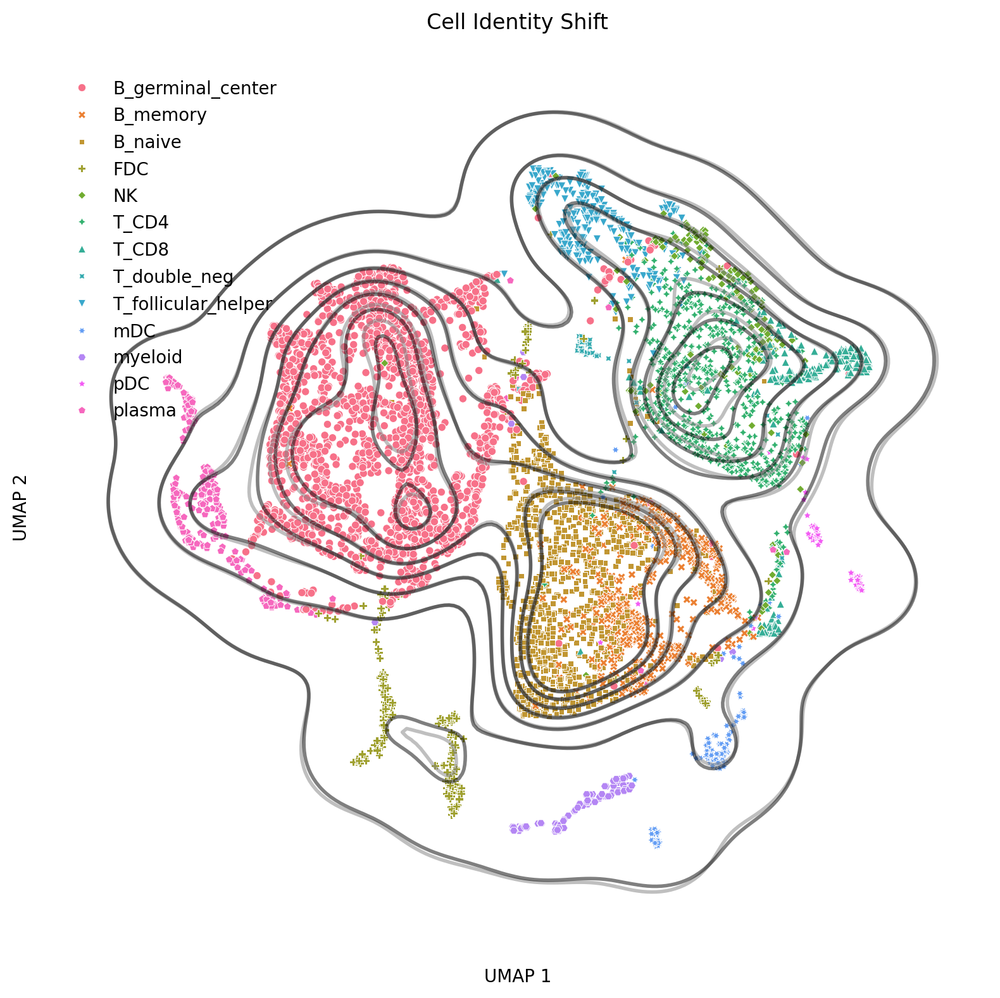

In [213]:
pythia.plot_contour_shift()

In [96]:
cells

[60,
 196,
 220,
 239,
 257,
 522,
 594,
 633,
 692,
 741,
 902,
 1441,
 1658,
 1670,
 2047,
 2148,
 2207,
 2575,
 2596,
 2956,
 2990,
 3022,
 3118,
 3140,
 3530,
 3570,
 3740,
 3819,
 4046,
 4220,
 4245,
 4495,
 4631,
 4643,
 4882,
 4889,
 4969,
 5140,
 5173,
 5187,
 5189,
 5273,
 5303,
 5309,
 5365,
 5413,
 5545,
 5580,
 5690]

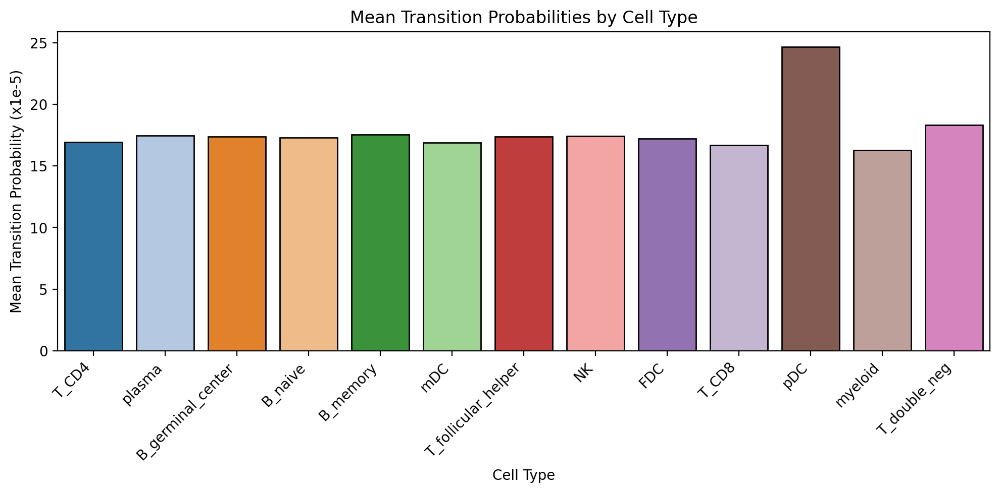

In [61]:
# Create dictionary to store values
ct_means = {}
for ct in pythia.adata.obs['cell_type'].unique():
    idx = pythia.adata[pythia.adata.obs['cell_type']==ct].obs_names
    ct_means[ct] = pd.DataFrame(
        ck_rand.transition_matrix.toarray(), 
        index=adata_shuff.obs_names, 
        columns=adata_shuff.obs_names).loc[idx, idx].mean().mean() * 1e5

# Convert to DataFrame for seaborn
plot_df = pd.DataFrame({'Cell Type': ct_means.keys(), 'Mean Transition Probability': ct_means.values()})

# Create bar plot using seaborn
plt.figure(figsize=(10,5))
sns.barplot(
    data=plot_df, x='Cell Type', 
    y='Mean Transition Probability', 
    linewidth=1, 
    edgecolor='black', 
    palette='tab20'
)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Mean Transition Probability (x1e-5)')
plt.title('Mean Transition Probabilities by Cell Type')
plt.tight_layout()
plt.show()

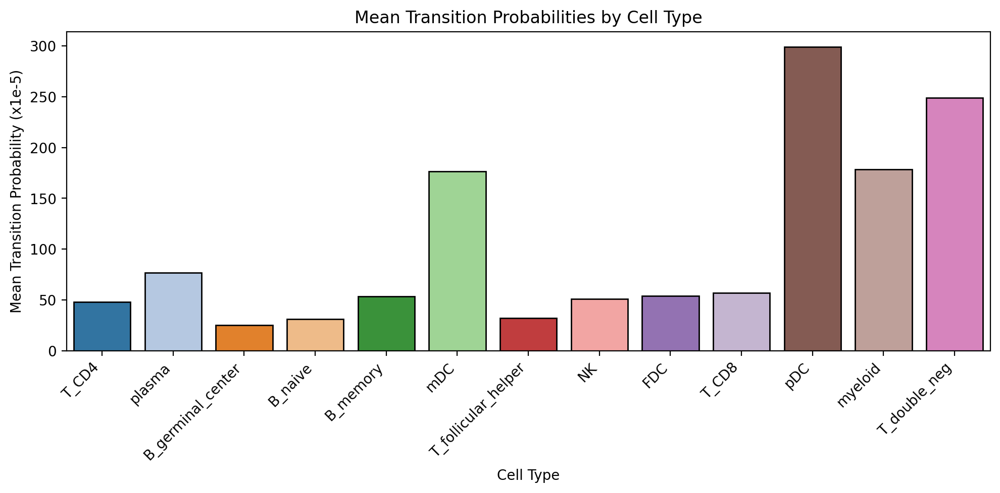

In [49]:
# Create dictionary to store values
ct_means = {}
for ct in pythia.adata.obs['cell_type'].unique():
    idx = pythia.adata[pythia.adata.obs['cell_type']==ct].obs_names
    ct_means[ct] = pd.DataFrame(
        ck.transition_matrix.toarray(), 
        index=pythia.adata.obs_names, 
        columns=pythia.adata.obs_names).loc[idx, idx].mean().mean() * 1e5

# Convert to DataFrame for seaborn
plot_df = pd.DataFrame({'Cell Type': ct_means.keys(), 'Mean Transition Probability': ct_means.values()})

# Create bar plot using seaborn
plt.figure(figsize=(10,5))
sns.barplot(
    data=plot_df, x='Cell Type', 
    y='Mean Transition Probability', 
    linewidth=1, 
    edgecolor='black', 
    palette='tab20'
)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Mean Transition Probability (x1e-5)')
plt.title('Mean Transition Probabilities by Cell Type')
plt.tight_layout()
plt.show()